# Prompt

## Homework 04

You are given two images hw4-input.jpg and hw4-output.jpg. Both are historic aerial images of UNT campus copied from the UNT Digital Library. If you look at hw4-input.jpg, it is darker overall and can be made brighter. I want it to have the same brightness distribution as hw4-output.jpg. Your task is to use the histogram matching/specification technique described in pages 156-163. You would obtain 𝑝𝑟(𝑟𝑗) from hw4-input.jpg and 𝑝𝑧(𝑧𝑖) from hw4-output.jpg and perform the 4 steps described on page 158. Submit a Jupyter notebook (ipynb) file. Make sure you run your code and leave all the input and output in the ipynb file. You need to show histogram of 𝑝𝑟(𝑟𝑗), histogram of 𝑝𝑧(𝑧𝑖), histogram of the output image, the output image and an image similar to Figure 3.21 that shows the mapping from input brightness levels to output brightness levels.

## Homework 05

In homework 4 you applied the histogram specification technique on hw4-input.jpg. Let us call the output from your code as hw4-result.jpg. For this homework you will use both these images as inputs. So, copy hw4-input.jpg into hw5-input-1.jpg and hw4-result.jpg into hw5-input-2.jpg. Then, apply the unsharp masking and highboost filtering procedure described in Example 3.21 on page 207 and produce images similar to Figure 3.55f. Write your code in Python in a Jupyter notebook. So, you will apply the same technique to both input images and produce two output images. Call them hw5-output-1.jpg and hw5-output-2.jpg respectively. Then, diff the two images and call it hw5-diff.jpg. Submit a Jupyter notebook ipynb file with all your code with explanations and images displayed and commented on. Discuss your results using a markdown cell at the end of your notebook.

# Imports

In [1]:
import cv2
import math
import matplotlib.pyplot as plt
import numpy as np
import skimage

from google.colab.patches import cv2_imshow
from sklearn.preprocessing import minmax_scale

# Global Variables

In [2]:
# Root directory
img_dir = "drive/MyDrive/Classes/CSCE 5225 Image Processing/"

# Number of levels
L = 256

# Code - Homework 04

## Get Images

In [3]:
# Directory
img_inp = img_dir + "hw4-input.jpg"
img_out = img_dir + "hw4-output.jpg"

# Load
img_inp = cv2.imread(img_inp)
img_out = cv2.imread(img_out)

# Convert to grayscale
img_inp = cv2.cvtColor(img_inp, cv2.COLOR_BGR2GRAY)
img_out = cv2.cvtColor(img_out, cv2.COLOR_BGR2GRAY)

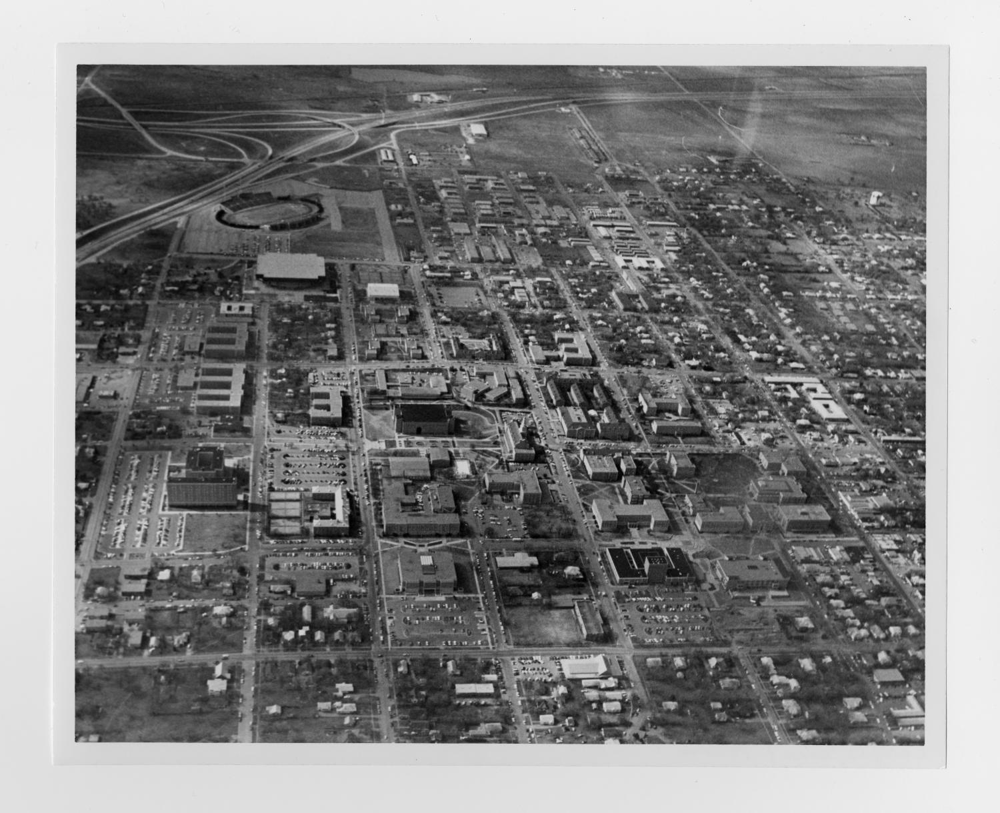

In [4]:
cv2_imshow(img_inp)

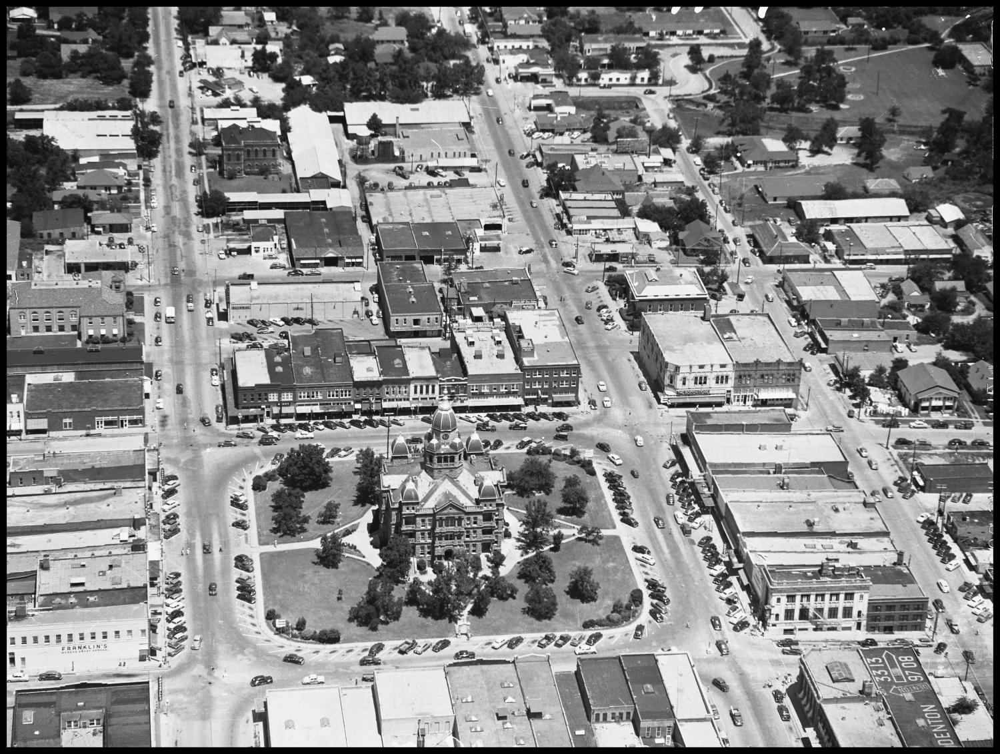

In [5]:
cv2_imshow(img_out)

In [6]:
# Trim images
img_inp = img_inp[99:1115, 115:1388]
img_out = img_out[10:1122, 10:1490]

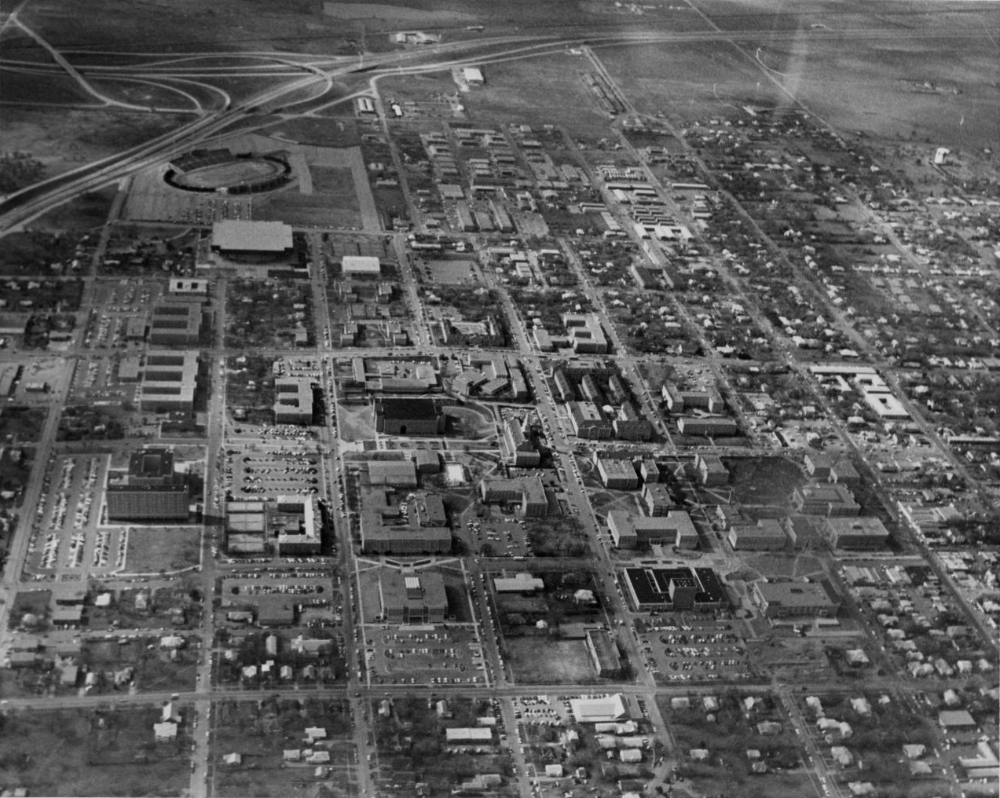

In [7]:
cv2_imshow(img_inp)

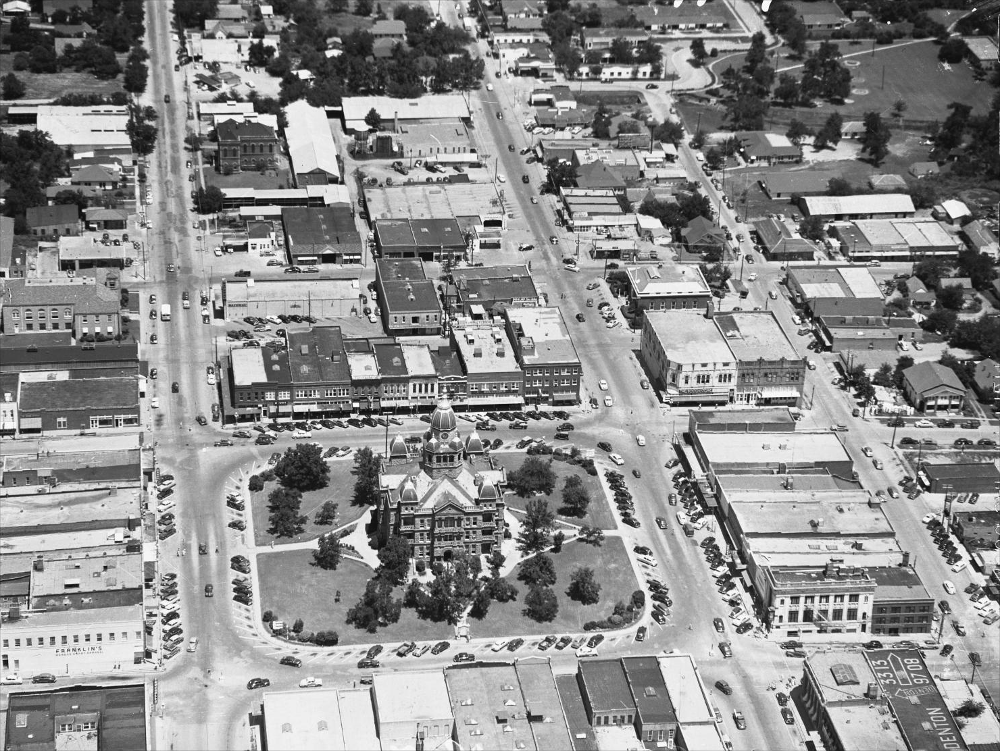

In [8]:
cv2_imshow(img_out)

## Get Image Histograms

In [9]:
# Function to display histograms side-by-side
def plot_histograms(inp_bins, out_bins, title=None, share_y=True):
    fig, ax = plt.subplots(1, 2, sharey=share_y, figsize=(15, 5))

    # Input image
    ax[0].bar(list(inp_bins.keys()), list(inp_bins.values()))
    ax[0].set_title("Input Image Histogram")

    # Output image
    ax[1].bar(list(out_bins.keys()), list(out_bins.values()))
    ax[1].set_title("Output Image Histogram")

    # Title
    if title is not None:
        fig.suptitle(title)

    plt.show()

In [10]:
# Function to get histogram values
def get_img_histogram(img):
    unique, counts = np.unique(img, return_counts=True)
    zipped = dict(zip(unique, counts))

    bins = {}
    for i in range(L):
        if i in zipped:
            bins.update({i: int(zipped[i])})
        else:
            bins.update({i: 0})
    
    return bins

In [11]:
# Get histogram values
img_inp_bins = get_img_histogram(img_inp)
img_out_bins = get_img_histogram(img_out)

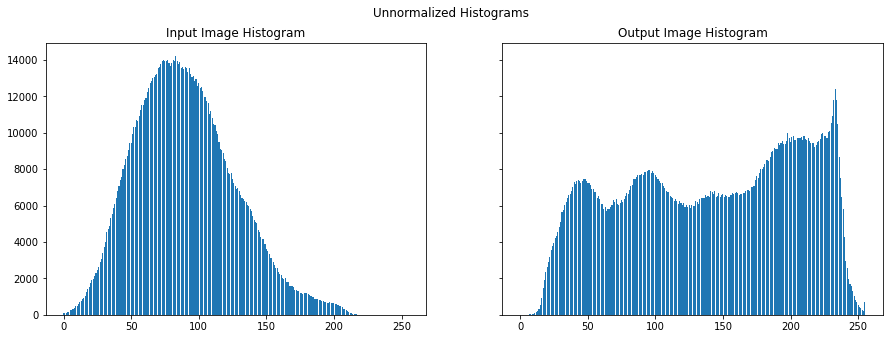

In [12]:
# Display histograms
plot_histograms(img_inp_bins, img_out_bins, title="Unnormalized Histograms")

In [13]:
# Function to get normalzied histogram values
def get_img_histogram_normalized(img):

    # Get values
    m, n = img.shape
    bins = get_img_histogram(img)

    # Normalize
    for i in bins:
        bins[i] = bins[i] / (m * n)

    return bins

In [14]:
# Get histogram values
img_inp_bins_norm  = get_img_histogram_normalized(img_inp)
img_out_bins_norm = get_img_histogram_normalized(img_out)

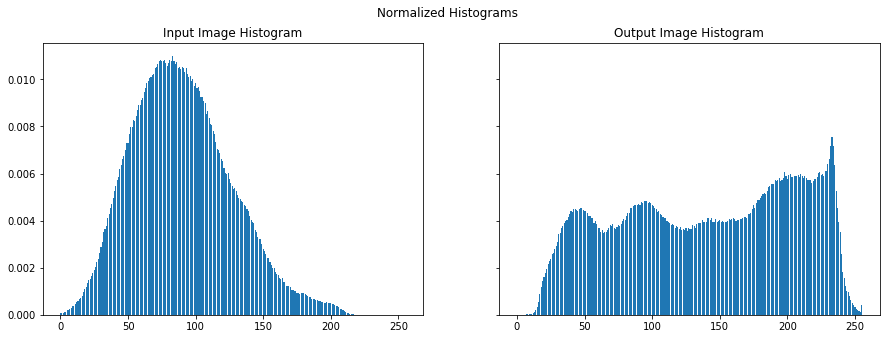

In [15]:
# Display histograms
plot_histograms(img_inp_bins_norm, img_out_bins_norm, title="Normalized Histograms")

## Get Mappings

In [16]:
# Get integral values at locations (s_k and z_k)
def get_integral(bins_norm, k):
    s_k = 0
    for i in range(k + 1):
        s_k += bins_norm[i]
    s_k *= L - 1
    return s_k

In [17]:
# Get maping of bin values to rounded integral values
def get_integral_map(bins_norm, k):

    # Build dict
    old_to_new = {}
    for i in range(k + 1):
        old_to_new.update({i: 0})

    # Get integral values
    for i in range(k + 1):
        s_k = get_integral(bins_norm, i)
        r_s_k = round(s_k)
        old_to_new[i] = r_s_k

    return old_to_new

In [18]:
# Find closest value in a list
def closest(l, val): 
    return l[min(range(len(l)), key = lambda i: abs(l[i] - val))]

In [19]:
# Map old values in input image to new values based on target (output) image
def build_map(old_to_new_inp, old_to_new_out):

    # Bulid out list for closest-value matching
    out = []
    out_vals = list(old_to_new_out.values())
    for i in old_to_new_out:
        out.append([i, old_to_new_out[i]])

    # Initial mapping build
    mapping = {}
    for s_k in list(set(old_to_new_inp.values())):
        mapping.update({s_k: None})
        
        # Get exact matches of s_k to G(z_q)
        for k in old_to_new_out:
            if old_to_new_out[k] == s_k:
                mapping[s_k] = k
                break

    # If mapping is missing, get closest value mapping
    for s_k in mapping:
        if mapping[s_k] is None:
            c = closest(out_vals, s_k)
            i = out_vals.index(c)
            mapping[s_k] = out[i][0]

    # Map directly from input bin to output bin
    mapping_new = {}
    for i in range(L):
        x = old_to_new_inp[i]
        if x in mapping:
            mapping_new.update({i: mapping[x]})
            
    return mapping_new

In [20]:
# Get mappings of images
old_to_new_inp = get_integral_map(img_inp_bins_norm, L - 1)
old_to_new_out = get_integral_map(img_out_bins_norm, L - 1)

In [21]:
# Get final map
mapping = build_map(old_to_new_inp, old_to_new_out)

## Plot Transformation Function

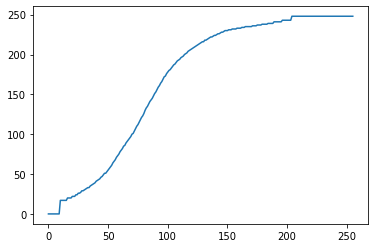

In [22]:
# Get values
mapping_disp_x = []
mapping_disp_y = []
for k in range(L):
    mapping_disp_x.append(k)
    if k in mapping:
        mapping_disp_y.append(mapping[k])
    else:
        mapping_disp_y.append(k)

# Plot
plt.plot(mapping_disp_x, mapping_disp_y)
plt.show()

## Adjust Input Image

In [23]:
# Map values
# inp_m, inp_n = img_inp.shape
img_adj = np.zeros(img_inp.shape)
for i in range(img_inp.shape[0]):
    for j in range(img_inp.shape[1]):
        x = img_inp[i, j]
        if x in mapping:
            x = mapping[x]
        img_adj[i, j] = x

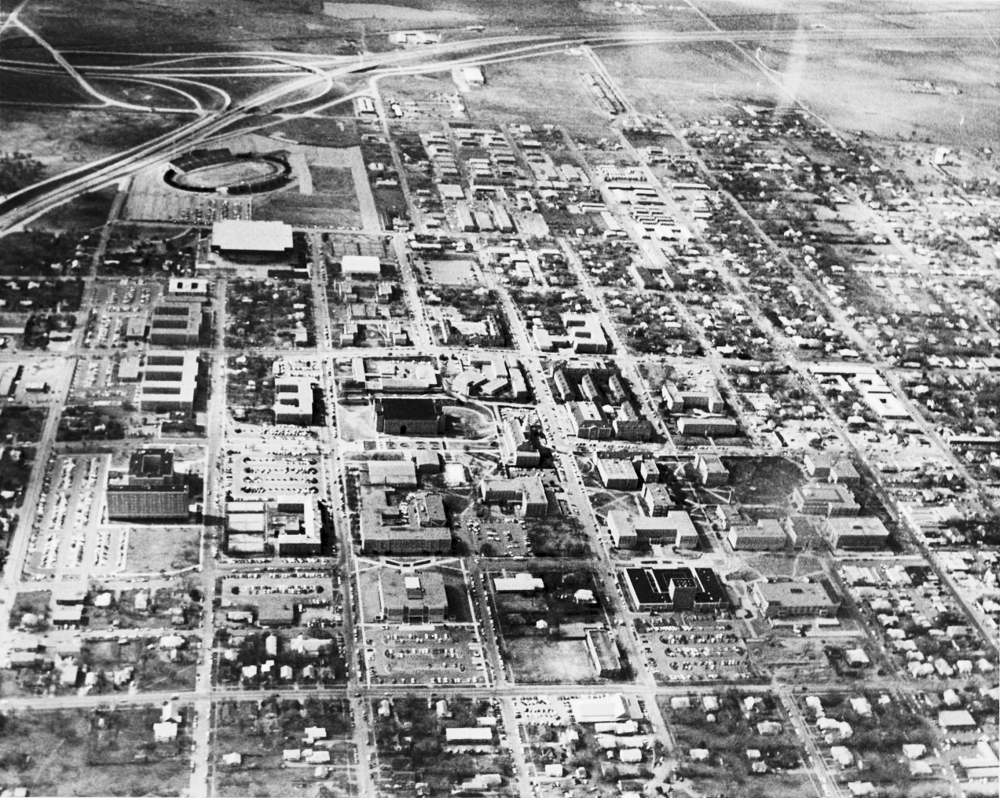

In [24]:
# Display
cv2_imshow(img_adj)

## Display All Histograms

In [25]:
# Histograms of adjusted image
img_adj_bins = get_img_histogram(img_adj)
img_adj_bins_norm = get_img_histogram_normalized(img_adj)

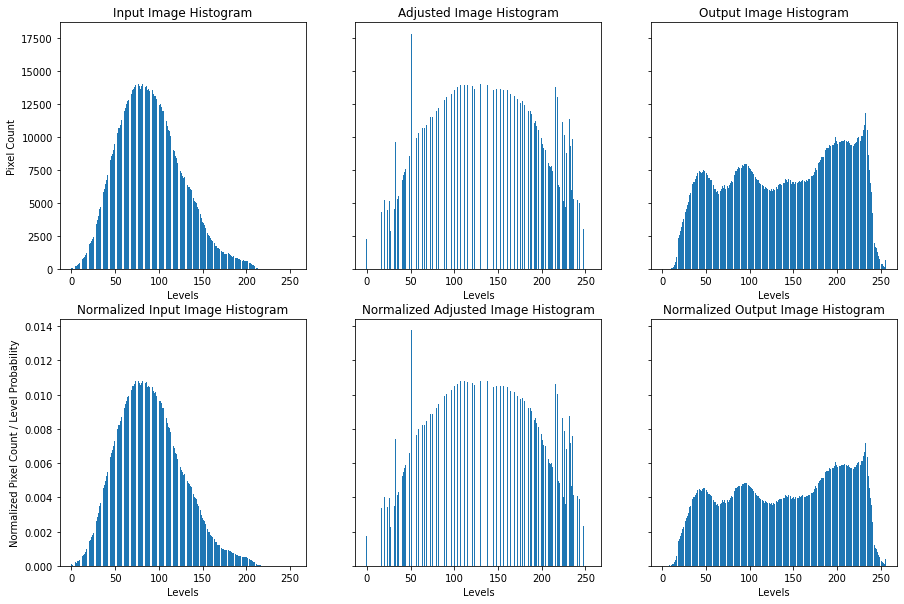

In [26]:
# Plot histograms
fig, ax = plt.subplots(2, 3, sharey="row", figsize=(15, 10))

# Plot unnormalized histograms
ax[0, 0].bar(list(img_inp_bins.keys()), list(img_inp_bins.values()))
ax[0, 0].set_title("Input Image Histogram")

ax[0, 1].bar(list(img_adj_bins.keys()), list(img_adj_bins.values()))
ax[0, 1].set_title("Adjusted Image Histogram")

ax[0, 2].bar(list(img_out_bins.keys()), list(img_out_bins.values()))
ax[0, 2].set_title("Output Image Histogram")

# Plot normalized histograms
ax[1, 0].bar(list(img_inp_bins_norm.keys()), list(img_inp_bins_norm.values()))
ax[1, 0].set_title("Normalized Input Image Histogram")

ax[1, 1].bar(list(img_adj_bins_norm.keys()), list(img_adj_bins_norm.values()))
ax[1, 1].set_title("Normalized Adjusted Image Histogram")

ax[1, 2].bar(list(img_out_bins_norm.keys()), list(img_out_bins_norm.values()))
ax[1, 2].set_title("Normalized Output Image Histogram")

# Set axis labels
for a in ax.flat:
    a.set(xlabel="Levels")
labels = ["Pixel Count", "Normalized Pixel Count / Level Probability"]
for a, row in zip(ax[:, 0], labels):
    a.set_ylabel(row)

plt.show()

# Code - Homework 05

## Get Images

In [27]:
# Save Homework 04 output
plt.imsave(img_dir + "hw4-result.jpg", img_adj, cmap="gray")

# Copy files
plt.imsave(img_dir + "hw5-input-1.jpg", img_inp, cmap="gray")
plt.imsave(img_dir + "hw5-input-2.jpg", img_adj, cmap="gray")

In [28]:
# Directory
img_inp_1 = img_dir + "hw5-input-1.jpg"
img_inp_2 = img_dir + "hw5-input-2.jpg"
img_test = "https://is2-ssl.mzstatic.com/image/thumb/Purple123/v4/10/8f/c4/108fc43d-dc90-a8c9-62f6-5fa3d35663ed/source/256x256bb.jpg"

# Load
img_inp_1 = plt.imread(img_inp_1)
img_inp_2 = plt.imread(img_inp_2)
img_test = skimage.io.imread(img_test)

# Convert to grayscale (shape)
img_inp_1 = cv2.cvtColor(img_inp_1, cv2.COLOR_BGR2GRAY)
img_inp_2 = cv2.cvtColor(img_inp_2, cv2.COLOR_BGR2GRAY)
img_test = cv2.cvtColor(img_test, cv2.COLOR_BGR2GRAY)

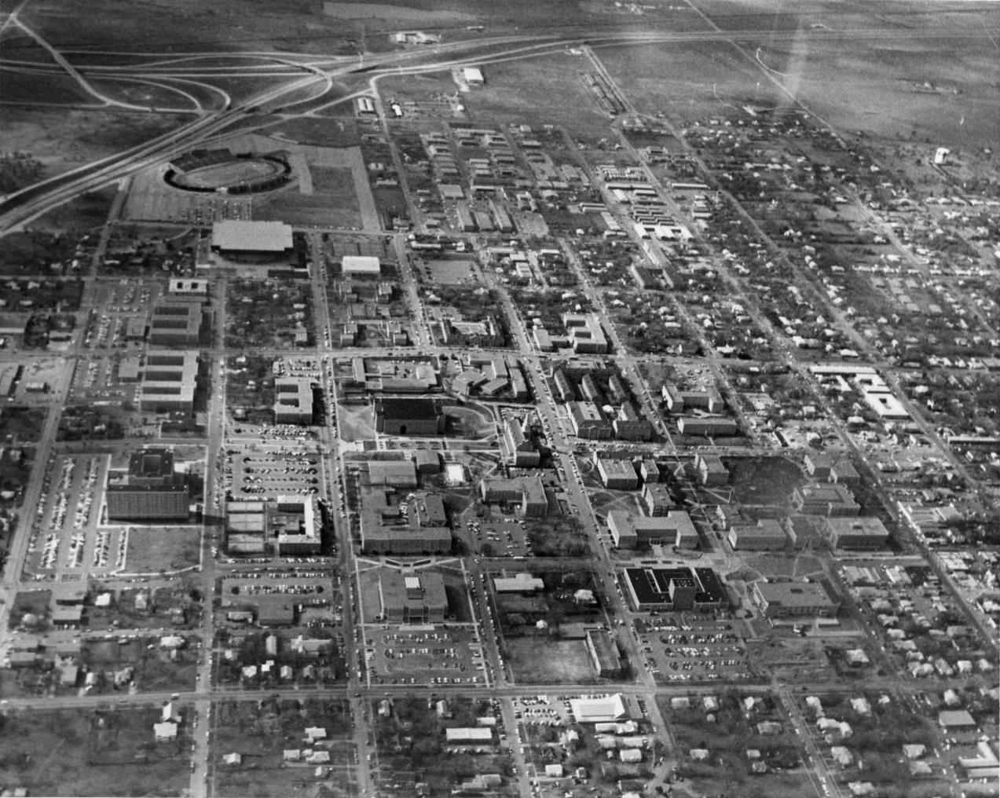

In [29]:
cv2_imshow(img_inp_1)

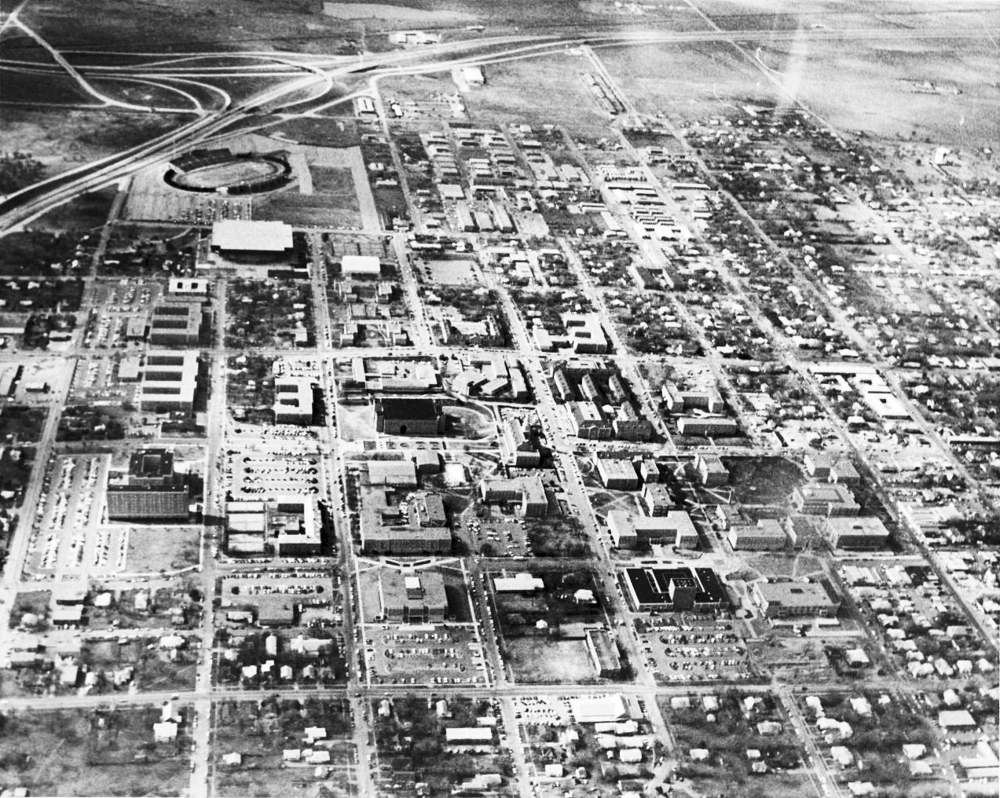

In [30]:
cv2_imshow(img_inp_2)

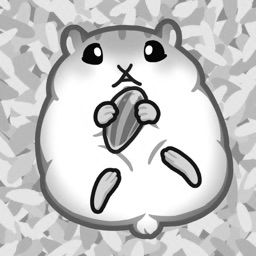

In [31]:
cv2_imshow(img_test)

## Define Convolving Functions

In [32]:
# Convolve window across image
def convolve(img, win):

    # Get values
    m, n = win.shape
    a = int((m - 1) / 2)
    b = int((n - 1) / 2)
    result = np.zeros(img.shape)

    # Pad original image with 0
    img_padd = np.zeros((img.shape[0] + (m - 1), img.shape[1] + (n - 1)))
    for i, row in enumerate(img):
        for j, val in enumerate(row):
            img_padd[i + a, j + b] = img[i, j]

    # Iterate over padded image, drop last rows and columns to accomodate window
    for i, i_row in enumerate(img_padd):
        if (i + m) > len(img_padd):
            break
        for j, i_val in enumerate(i_row):
            if (j + n) > len(img_padd[i]):
                break

            # Get kernel value
            g = 0
            for k, w_row in enumerate(win):
                for l, w_val in enumerate(w_row):
                    g += w_val * img_padd[i + k, j + l]

            # Apply kernel value
            result[i, j] = g
    return result

In [33]:
# Flip correlation kernal to convolution kernal
def corr_to_conv(corr):
    m, n = corr.shape
    conv = np.zeros(corr.shape)
    for i in range(m):
        for j in range(n):
            conv[i, j] = corr[m - 1 - i, n - 1 - j]
    return conv

In [34]:
# Test convolve

f = np.zeros((5, 5))
f[2, 2] = 1

w_corr = np.zeros((3, 3))
for i in range(3):
    for j in range(3):
        w_corr[i, j] = i * 3 + j + 1

w_conv = corr_to_conv(w_corr)

print(convolve(f, w_corr))
print()
print(convolve(f, w_conv))

[[0. 0. 0. 0. 0.]
 [0. 9. 8. 7. 0.]
 [0. 6. 5. 4. 0.]
 [0. 3. 2. 1. 0.]
 [0. 0. 0. 0. 0.]]

[[0. 0. 0. 0. 0.]
 [0. 1. 2. 3. 0.]
 [0. 4. 5. 6. 0.]
 [0. 7. 8. 9. 0.]
 [0. 0. 0. 0. 0.]]


## Define Kernels

[[0.02040816 0.02040816 0.02040816 0.02040816 0.02040816 0.02040816
  0.02040816]
 [0.02040816 0.02040816 0.02040816 0.02040816 0.02040816 0.02040816
  0.02040816]
 [0.02040816 0.02040816 0.02040816 0.02040816 0.02040816 0.02040816
  0.02040816]
 [0.02040816 0.02040816 0.02040816 0.02040816 0.02040816 0.02040816
  0.02040816]
 [0.02040816 0.02040816 0.02040816 0.02040816 0.02040816 0.02040816
  0.02040816]
 [0.02040816 0.02040816 0.02040816 0.02040816 0.02040816 0.02040816
  0.02040816]
 [0.02040816 0.02040816 0.02040816 0.02040816 0.02040816 0.02040816
  0.02040816]]


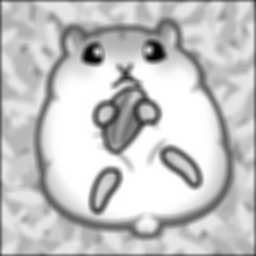

In [35]:
# Box kernel
def box_kernel(x):
    kernel = np.ones((x, x))
    for i in range(x):
        for j in range(x):
            kernel[i, j] = 1.0 / (x * x)
    return kernel

k = box_kernel(7)
print(k)
img_test_blur = convolve(img_test, k)
cv2_imshow(img_test_blur)

[[1.96519161e-05 2.39409349e-04 1.07295826e-03 1.76900911e-03
  1.07295826e-03 2.39409349e-04 1.96519161e-05]
 [2.39409349e-04 2.91660295e-03 1.30713076e-02 2.15509428e-02
  1.30713076e-02 2.91660295e-03 2.39409349e-04]
 [1.07295826e-03 1.30713076e-02 5.85815363e-02 9.65846250e-02
  5.85815363e-02 1.30713076e-02 1.07295826e-03]
 [1.76900911e-03 2.15509428e-02 9.65846250e-02 1.59241126e-01
  9.65846250e-02 2.15509428e-02 1.76900911e-03]
 [1.07295826e-03 1.30713076e-02 5.85815363e-02 9.65846250e-02
  5.85815363e-02 1.30713076e-02 1.07295826e-03]
 [2.39409349e-04 2.91660295e-03 1.30713076e-02 2.15509428e-02
  1.30713076e-02 2.91660295e-03 2.39409349e-04]
 [1.96519161e-05 2.39409349e-04 1.07295826e-03 1.76900911e-03
  1.07295826e-03 2.39409349e-04 1.96519161e-05]]


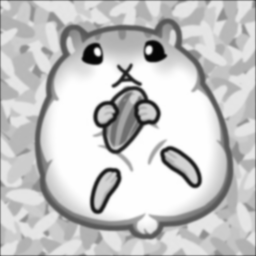

In [36]:
# Lowpass gaussian kernel
# https://stackoverflow.com/questions/29731726/how-to-calculate-a-gaussian-kernel-matrix-efficiently-in-numpy
def gaussian_kernel(m, sigma):
    l_space = np.linspace(-(m - 1) / 2.0, (m - 1) / 2.0, m)
    exps = np.exp(-0.5 * np.square(l_space) / np.square(sigma))
    kernel = np.outer(exps, exps)
    return kernel / np.sum(kernel)

k = gaussian_kernel(7, 1)
print(k)
img_test_blur = convolve(img_test, k)
cv2_imshow(img_test_blur)

## Masking Functions

In [37]:
def normalize(m):
    m = m - m.min()
    m = (m / m.max()) * L * 1.0
    return m

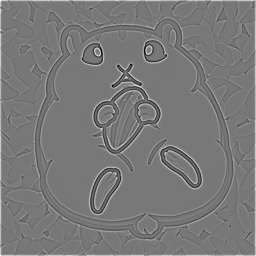

In [38]:
# Get unsharp mask
def get_mask(img, img_blur):

    # Subtrack blurred image from original to get mask
    mask = np.subtract(img, img_blur)

    return mask

mask = get_mask(img_test, img_test_blur)
cv2_imshow(normalize(mask))

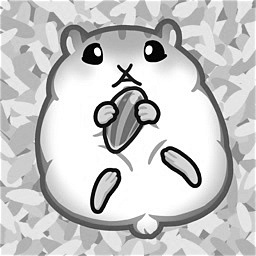

In [39]:
# Add mask back to original
def add_mask_to_img(img, mask, k):
    add = np.add(img, (mask * k))
    return add

img_test_add = add_mask_to_img(img_test, mask, 0.5)
cv2_imshow(img_test_add)

## Unsharp Masking

In [ ]:
# Get blurred images
kernel = gaussian_kernel(10, sigma=5)
img_blur_1 = convolve(img_inp_1, kernel)
img_blur_2 = convolve(img_inp_2, kernel)
cv2_imshow(np.concatenate((img_blur_1, img_blur_2), axis=1))

In [ ]:
# Get masks

# Unnormalized for math
mask_1 = get_mask(img_inp_1, img_blur_1)
mask_2 = get_mask(img_inp_2, img_blur_2)

cv2_imshow(np.concatenate((normalize(mask_1), normalize(mask_2)), axis=1))

In [ ]:
# Unsharp masking with k = 0.5
img_unsharp_1 = add_mask_to_img(img_inp_1, mask_1, 0.5)
img_unsharp_2 = add_mask_to_img(img_inp_2, mask_2, 0.5)
cv2_imshow(np.concatenate((img_unsharp_1, img_unsharp_2), axis=1))

In [ ]:
# Unsharp masking with k = 1
img_unsharp_1 = add_mask_to_img(img_inp_1, mask_1, 1)
img_unsharp_2 = add_mask_to_img(img_inp_2, mask_2, 1)
cv2_imshow(np.concatenate((img_unsharp_1, img_unsharp_2), axis=1))

## Highboost Filtering

In [ ]:
# Highboost filtering with k = 2
img_highboost_1 = add_mask_to_img(img_inp_1, mask_1, 2)
img_highboost_2 = add_mask_to_img(img_inp_2, mask_2, 2)
cv2_imshow(np.concatenate((img_highboost_1, img_highboost_2), axis=1))

In [ ]:
# Highboost filtering with k = 3
img_highboost_1 = add_mask_to_img(img_inp_1, mask_1, 3)
img_highboost_2 = add_mask_to_img(img_inp_2, mask_2, 3)
cv2_imshow(np.concatenate((img_highboost_1, img_highboost_2), axis=1))

## Display All Images

In [ ]:
# Original
cv2_imshow(np.concatenate((img_inp_1, img_inp_2), axis=1))

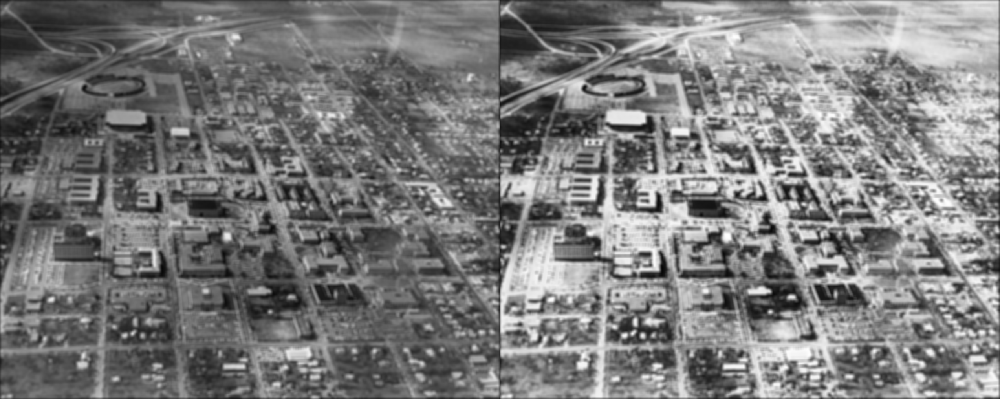

In [ ]:
# Blurred
cv2_imshow(np.concatenate((img_blur_1, img_blur_2), axis=1))

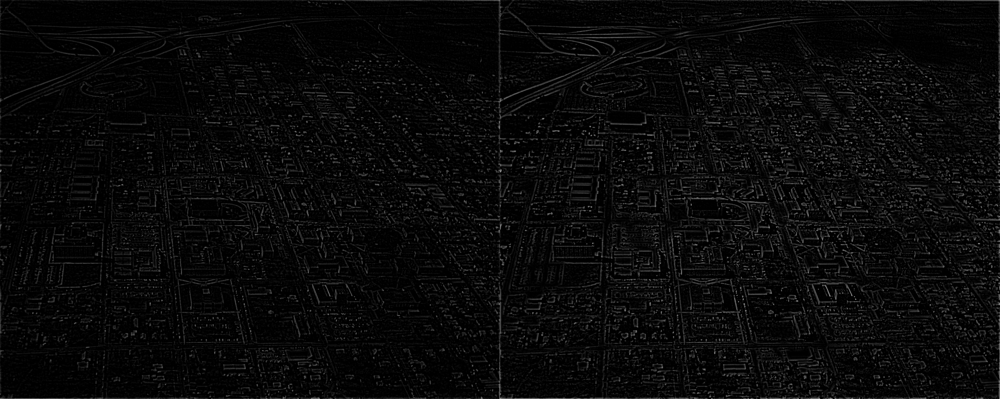

In [ ]:
# Masks raw
cv2_imshow(np.concatenate((mask_1, mask_2), axis=1))

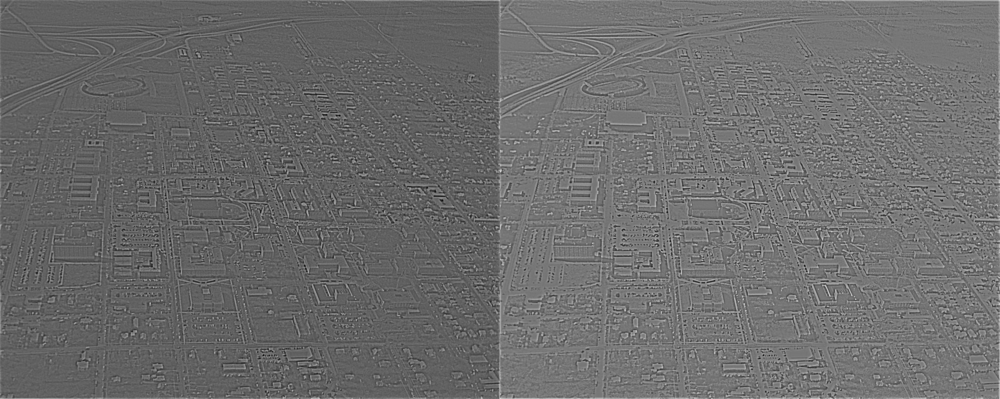

In [ ]:
# Masks normalized
cv2_imshow(np.concatenate((normalize(mask_1), normalize(mask_2)), axis=1))

In [ ]:
# Unsharp filtered
cv2_imshow(np.concatenate((img_unsharp_1, img_unsharp_2), axis=1))

In [ ]:
# Highboost filtered
cv2_imshow(np.concatenate((img_highboost_1, img_highboost_2), axis=1))

## Subtract Images

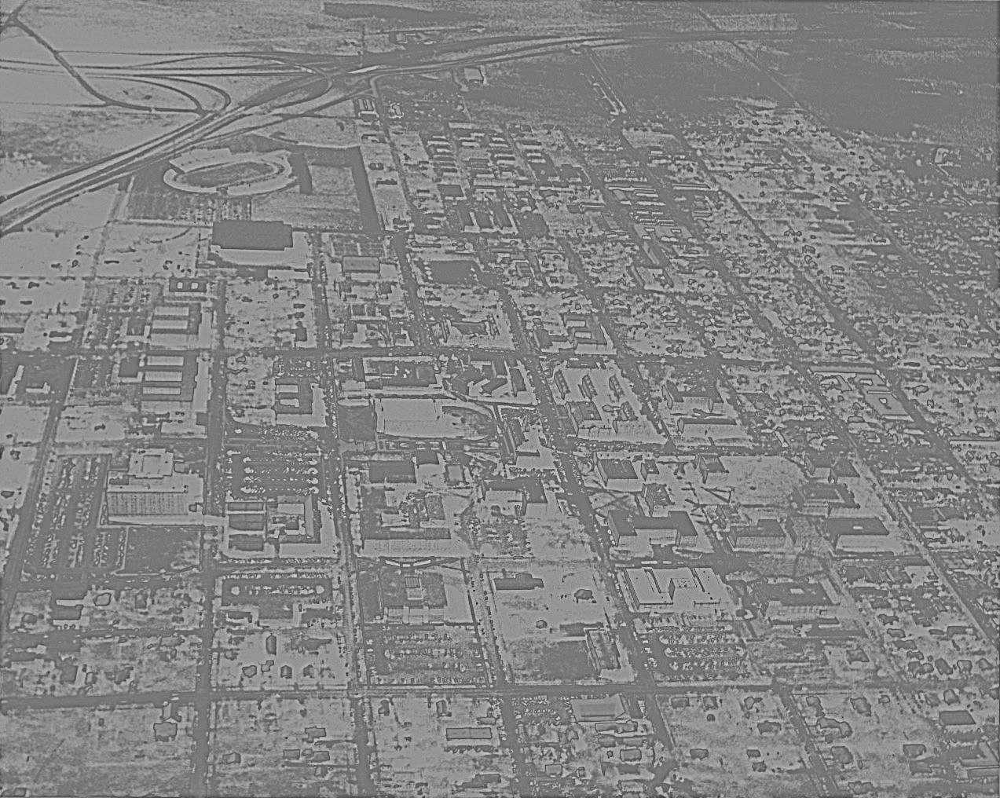

In [ ]:
# img_highboost_1 - img_highboost_2
diff_1_2 = np.subtract(img_highboost_1, img_highboost_2)
cv2_imshow(normalize(diff_1_2))

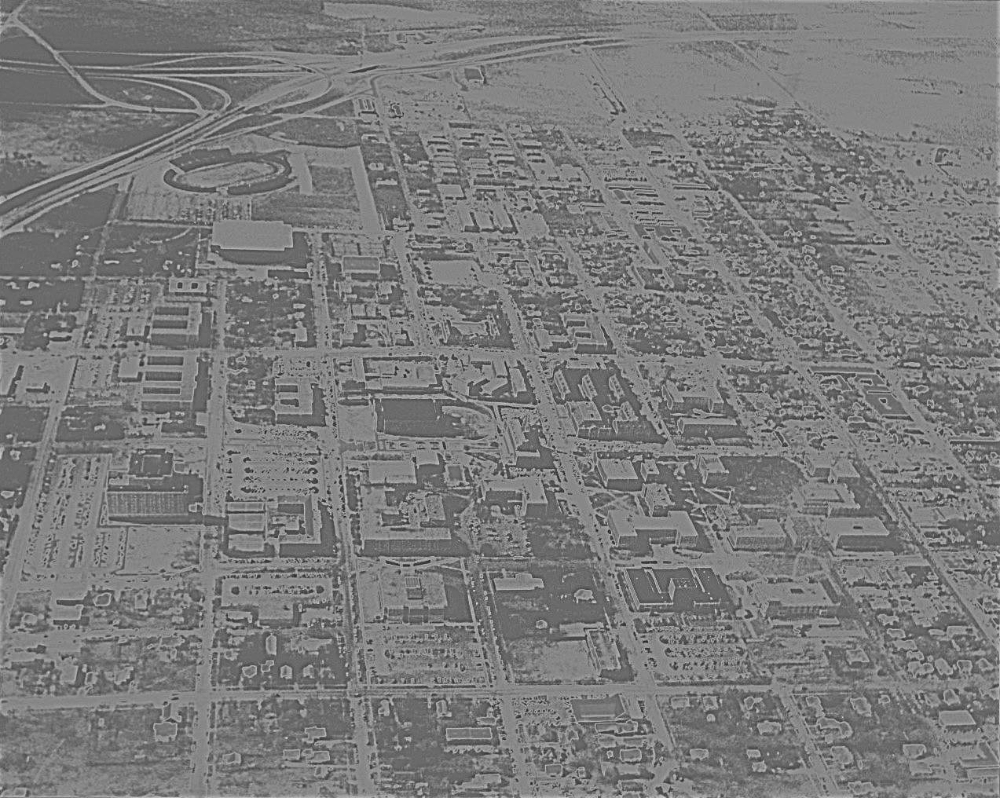

In [ ]:
# img_highboost_2 - img_highboost_1
diff_2_1 = np.subtract(img_highboost_2, img_highboost_1)
cv2_imshow(normalize(diff_2_1))

## Save Images

In [ ]:
plt.imsave(img_dir + "hw5-output-1.jpg", img_highboost_1, cmap="gray")
plt.imsave(img_dir + "hw5-output-2.jpg", img_highboost_2, cmap="gray")
plt.imsave(img_dir + "hw5-diff.jpg", diff_1_2, cmap="gray")
plt.imsave(img_dir + "hw5-diff-2.jpg", diff_2_1, cmap="gray")

# Discussion

The mask images produced have values less than 0 and greater than 255, so for display purposes the mask images have to be normalized to see all of the detail. The normalized mask images are not applied in the unsharp or highboost operations, as the normalized values will cause a major shift in the level distribution of the image. Applying a gaussian kernel of size 10 by 10 with sigma 5 produces significant blur. Originally a kernel of size 31 by 31 was used to match the example's parameters, but it took too long to run and the kernel size was reduced. Applying the unsharp filtering with k=1 sharpened the image past the original image, if only slightly. Highboost filtering with k=3 exaggerated this even more, and the results are images that are starting to look grainy as they have been over-sharpened. Some of that graininess can be seen in the subtracted images. Notably subtracting the highboosted input 2 image from the highboosted input 1 image results in an image that greatly resembles the mask images. The inverse subtraction produces an image that resembles the inverse of the mask images.